In [1641]:
import scanpy as sc
import numpy as np

adata = sc.read_h5ad('/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Tumor_Deconvolution_rar/decon_6800STDY12499507')

quantile_750 = np.quantile(adata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_normal'], 0.80)
quantile_751 = np.quantile(adata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_tumor'], 0.80)


adata.obs['normal_level'] = (adata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_normal'] >= quantile_750).astype(int)
adata.obs['tumor_level'] = (adata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_tumor'] >= quantile_751).astype(int)
adata.obs['No level'] = 'normal or tumor spot' 
adata.obs.loc[(adata.obs['normal_level'] != 1) & (adata.obs['tumor_level'] != 1), 'No level'] = 'Not a spot'
adata.obs

,in_tissue,array_row,array_col,sample,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,...,donor_id,region,_indices,_scvi_batch,_scvi_labels,normal,tumor,normal_level,tumor_level,No level
spot_id,,,,,,,,,,,,,,,,,,,,,
6800STDY12499507_AAACAGAGCGACTCCT-1,1,14,94,6800STDY12499507,2514,7.830028,5756.0,8.658172,25.833912,34.746352,...,PD45816,g,0,0,0,1.249526,2.453520,0,0,Not a spot
6800STDY12499507_AAACAGTGTTCCTGGG-1,1,73,43,6800STDY12499507,541,6.295266,686.0,6.532334,24.344023,35.714286,...,PD45816,g,1,0,0,0.148209,0.276919,0,0,Not a spot
6800STDY12499507_AAACATGGTGAGAGGA-1,1,62,0,6800STDY12499507,1287,7.160846,2096.0,7.648263,24.666031,33.253817,...,PD45816,g,2,0,0,0.358498,1.026992,0,0,Not a spot
6800STDY12499507_AAACCGTTCGTCCAGG-1,1,52,42,6800STDY12499507,2474,7.813996,4776.0,8.471568,21.922111,29.103853,...,PD45816,g,3,0,0,1.173504,1.427299,0,0,Not a spot
6800STDY12499507_AAACGAAGAACATACC-1,1,6,64,6800STDY12499507,2037,7.619724,4542.0,8.421343,28.533686,37.758697,...,PD45816,g,4,0,0,0.686478,2.209321,0,0,Not a spot
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6800STDY12499507_TTGTTGGCAATGACTG-1,1,76,30,6800STDY12499507,243,5.497168,284.0,5.652489,32.042254,49.647887,...,PD45816,g,2140,0,0,0.048768,0.085642,0,0,Not a spot
6800STDY12499507_TTGTTGTGTGTCAAGA-1,1,31,77,6800STDY12499507,2796,7.936303,6304.0,8.749098,23.953046,32.852157,...,PD45816,g,2141,0,0,1.440037,2.559125,0,0,Not a spot
6800STDY12499507_TTGTTTCACATCCAGG-1,1,58,42,6800STDY12499507,675,6.516193,877.0,6.777647,21.892816,33.295325,...,PD45816,g,2142,0,0,0.476290,0.062589,0,0,Not a spot


In [1642]:
sc.pp.normalize_total(adata)

sc.pp.log1p(adata)

In [1643]:
# 6800STDY12499507

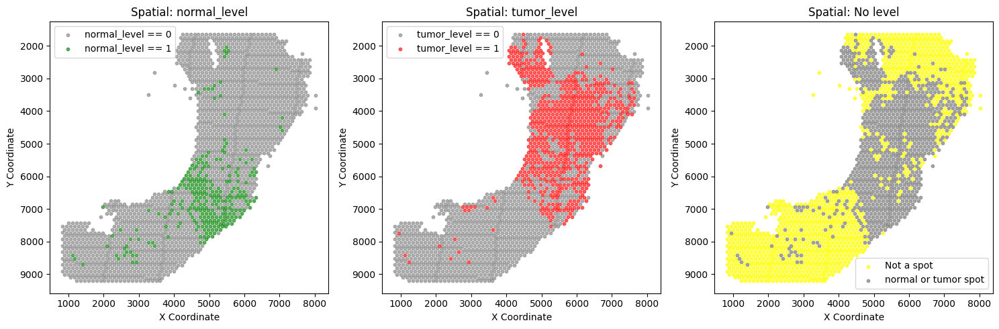

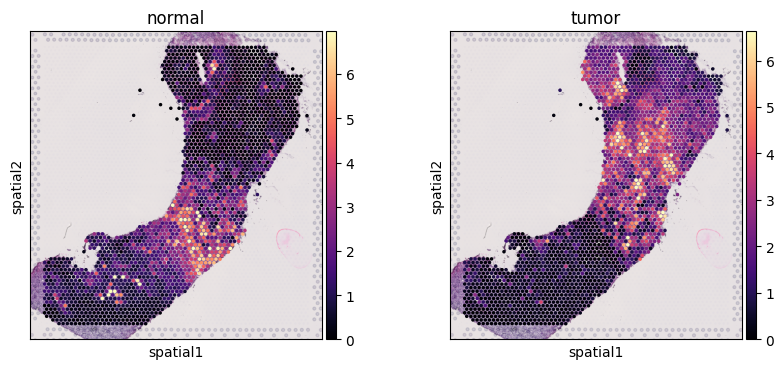

In [1644]:
import matplotlib.pyplot as plt

# 서브플롯 생성
fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # 1행 3열, 각각 크기 5x5

# 첫 번째 플롯: normal_level
axes[0].scatter(highlevel_0.obsm['spatial'][:, 0], 
                highlevel_0.obsm['spatial'][:, 1], 
                s=10, 
                color='gray', 
                alpha=0.6, 
                label='normal_level == 0')
axes[0].scatter(highlevel_1.obsm['spatial'][:, 0], 
                highlevel_1.obsm['spatial'][:, 1], 
                s=10, 
                color='green', 
                alpha=0.6, 
                label='normal_level == 1')
axes[0].invert_yaxis()  # Y축 반전
axes[0].set_title("Spatial: normal_level")
axes[0].set_xlabel("X Coordinate")
axes[0].set_ylabel("Y Coordinate")
axes[0].legend()

# 두 번째 플롯: tumor_level
axes[1].scatter(lowlevel_0.obsm['spatial'][:, 0], 
                lowlevel_0.obsm['spatial'][:, 1], 
                s=10, 
                color='gray', 
                alpha=0.6, 
                label='tumor_level == 0')
axes[1].scatter(lowlevel_1.obsm['spatial'][:, 0], 
                lowlevel_1.obsm['spatial'][:, 1], 
                s=10, 
                color='red', 
                alpha=0.6, 
                label='tumor_level == 1')
axes[1].invert_yaxis()
axes[1].set_title("Spatial: tumor_level")
axes[1].set_xlabel("X Coordinate")
axes[1].set_ylabel("Y Coordinate")
axes[1].legend()

# 세 번째 플롯: No level
axes[2].scatter(yellow_coords[:, 0], yellow_coords[:, 1], 
                color='yellow', 
                label='Not a spot', 
                alpha=0.7, 
                s=10)
axes[2].scatter(gray_coords[:, 0], gray_coords[:, 1], 
                color='grey', 
                label='normal or tumor spot', 
                alpha=0.7, 
                s=10)
axes[2].invert_yaxis()
axes[2].set_title("Spatial: No level")
axes[2].set_xlabel("X Coordinate")
axes[2].set_ylabel("Y Coordinate")
axes[2].legend()

# 서브플롯 간 간격 조정
plt.tight_layout()

# 그래프 출력
plt.show()

# 실제 image
import matplotlib.pyplot as mpl

with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4, 4]}):

    sc.pl.spatial(adata, cmap='magma',
              color=['normal', 'tumor'],
              ncols=4, size=1.3,
              img_key='hires',
              vmin=0, vmax='p99.2',
              library_id='spaceranger130_count_44317_6800STDY12499507_GRCh38-2020-A')

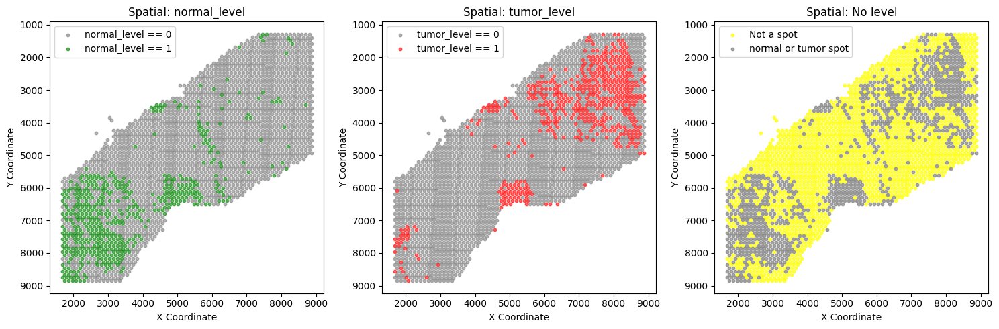

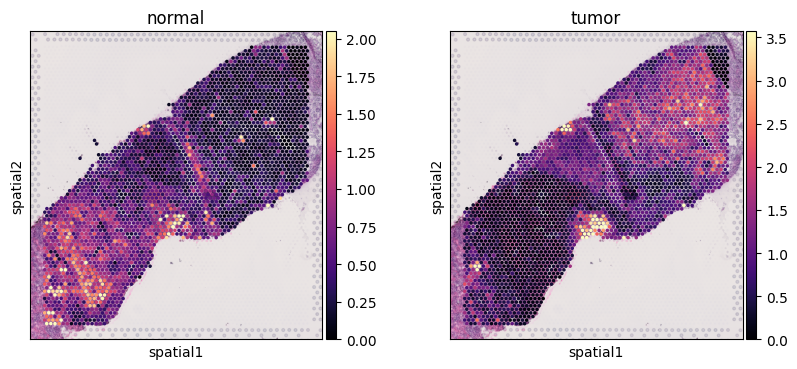

In [1679]:
import matplotlib.pyplot as plt
import numpy as np
import scanpy as sc

# 데이터 로드
adata = sc.read_h5ad('/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Tumor_Deconvolution_rar/decon_6800STDY12499502')

# 80% 분위수 계산 및 이진화
quantile_750 = np.quantile(adata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_normal'], 0.80)
quantile_751 = np.quantile(adata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_tumor'], 0.80)

adata.obs['normal_level'] = (adata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_normal'] >= quantile_750).astype(int)
adata.obs['tumor_level'] = (adata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_tumor'] >= quantile_751).astype(int)

# No level 정의
adata.obs['No level'] = 'normal or tumor spot'
adata.obs.loc[(adata.obs['normal_level'] != 1) & (adata.obs['tumor_level'] != 1), 'No level'] = 'Not a spot'

# 공간 좌표 추출
spatial_coords = adata.obsm['spatial']
normal_0_coords = spatial_coords[adata.obs['normal_level'] == 0]
normal_1_coords = spatial_coords[adata.obs['normal_level'] == 1]
tumor_0_coords = spatial_coords[adata.obs['tumor_level'] == 0]
tumor_1_coords = spatial_coords[adata.obs['tumor_level'] == 1]
yellow_coords = spatial_coords[adata.obs['No level'] == 'Not a spot']
gray_coords = spatial_coords[adata.obs['No level'] == 'normal or tumor spot']

# 서브플롯 생성
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# 첫 번째 플롯: normal_level
axes[0].scatter(normal_0_coords[:, 0], normal_0_coords[:, 1], s=10, color='gray', alpha=0.6, label='normal_level == 0')
axes[0].scatter(normal_1_coords[:, 0], normal_1_coords[:, 1], s=10, color='green', alpha=0.6, label='normal_level == 1')
axes[0].invert_yaxis()
axes[0].set_title("Spatial: normal_level")
axes[0].set_xlabel("X Coordinate")
axes[0].set_ylabel("Y Coordinate")
axes[0].legend()

# 두 번째 플롯: tumor_level
axes[1].scatter(tumor_0_coords[:, 0], tumor_0_coords[:, 1], s=10, color='gray', alpha=0.6, label='tumor_level == 0')
axes[1].scatter(tumor_1_coords[:, 0], tumor_1_coords[:, 1], s=10, color='red', alpha=0.6, label='tumor_level == 1')
axes[1].invert_yaxis()
axes[1].set_title("Spatial: tumor_level")
axes[1].set_xlabel("X Coordinate")
axes[1].set_ylabel("Y Coordinate")
axes[1].legend()

# 세 번째 플롯: No level
axes[2].scatter(yellow_coords[:, 0], yellow_coords[:, 1], color='yellow', label='Not a spot', alpha=0.7, s=10)
axes[2].scatter(gray_coords[:, 0], gray_coords[:, 1], color='grey', label='normal or tumor spot', alpha=0.7, s=10)
axes[2].invert_yaxis()
axes[2].set_title("Spatial: No level")
axes[2].set_xlabel("X Coordinate")
axes[2].set_ylabel("Y Coordinate")
axes[2].legend()

# 서브플롯 간 간격 조정
plt.tight_layout()
plt.show()
import matplotlib.pyplot as mpl

with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4, 4]}):

    sc.pl.spatial(adata, cmap='magma',
              color=['normal', 'tumor'],
              ncols=4, size=1.3,
              img_key='hires',
              vmin=0, vmax='p99.2',
              library_id='spaceranger130_count_44316_6800STDY12499502_GRCh38-2020-A')

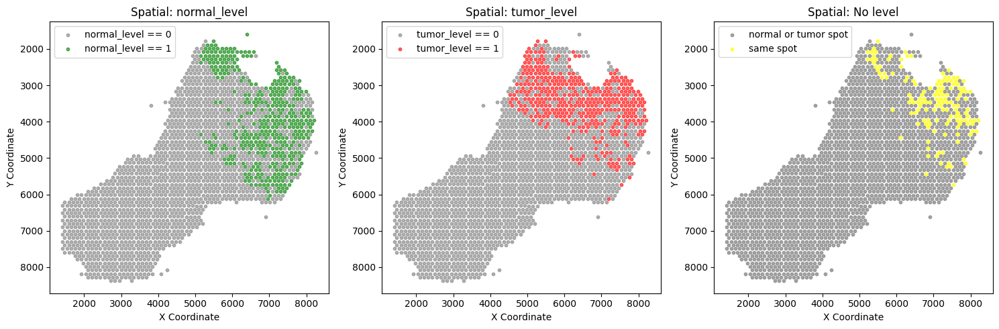

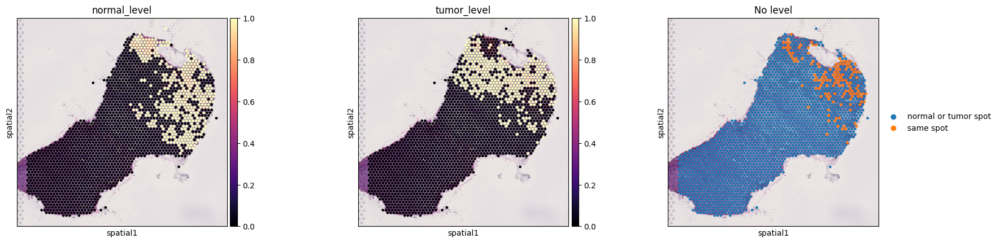

In [1789]:
import matplotlib.pyplot as plt
import numpy as np
import scanpy as sc

# 데이터 로드
adata = sc.read_h5ad('/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Tumor_Deconvolution_rar/decon_6800STDY12499411')

# 80% 분위수 계산 및 이진화
quantile_750 = np.quantile(adata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_normal'], 0.80)
quantile_751 = np.quantile(adata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_tumor'], 0.80)

adata.obs['normal_level'] = (adata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_normal'] >= quantile_750).astype(int)
adata.obs['tumor_level'] = (adata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_tumor'] >= quantile_751).astype(int)

# 'No level' 정의
adata.obs['No level'] = 'normal or tumor spot'
adata.obs.loc[(adata.obs['normal_level'] == 1) & (adata.obs['tumor_level'] == 1), 'No level'] = 'same spot'

# 공간 좌표 추출
spatial_coords = adata.obsm['spatial']
yellow_coords = spatial_coords[adata.obs['No level'] == 'same spot']
gray_coords = spatial_coords[adata.obs['No level'] == 'normal or tumor spot']

# 서브플롯 생성: normal_level, tumor_level, No level
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# 첫 번째 플롯: normal_level
normal_0_coords = spatial_coords[adata.obs['normal_level'] == 0]
normal_1_coords = spatial_coords[adata.obs['normal_level'] == 1]
axes[0].scatter(normal_0_coords[:, 0], normal_0_coords[:, 1], s=10, color='gray', alpha=0.6, label='normal_level == 0')
axes[0].scatter(normal_1_coords[:, 0], normal_1_coords[:, 1], s=10, color='green', alpha=0.6, label='normal_level == 1')
axes[0].invert_yaxis()
axes[0].set_title("Spatial: normal_level")
axes[0].set_xlabel("X Coordinate")
axes[0].set_ylabel("Y Coordinate")
axes[0].legend()

# 두 번째 플롯: tumor_level
tumor_0_coords = spatial_coords[adata.obs['tumor_level'] == 0]
tumor_1_coords = spatial_coords[adata.obs['tumor_level'] == 1]
axes[1].scatter(tumor_0_coords[:, 0], tumor_0_coords[:, 1], s=10, color='gray', alpha=0.6, label='tumor_level == 0')
axes[1].scatter(tumor_1_coords[:, 0], tumor_1_coords[:, 1], s=10, color='red', alpha=0.6, label='tumor_level == 1')
axes[1].invert_yaxis()
axes[1].set_title("Spatial: tumor_level")
axes[1].set_xlabel("X Coordinate")
axes[1].set_ylabel("Y Coordinate")
axes[1].legend()

# 세 번째 플롯: No level
axes[2].scatter(gray_coords[:, 0], gray_coords[:, 1], color='gray', label='normal or tumor spot', alpha=0.7, s=10)
axes[2].scatter(yellow_coords[:, 0], yellow_coords[:, 1], color='yellow', label='same spot', alpha=0.7, s=10)
axes[2].invert_yaxis()
axes[2].set_title("Spatial: No level")
axes[2].set_xlabel("X Coordinate")
axes[2].set_ylabel("Y Coordinate")
axes[2].legend()

plt.tight_layout()
plt.show()

# 추가적인 공간 데이터 시각화
sc.pl.spatial(
    adata,
    cmap='magma',
    color=['normal_level', 'tumor_level', 'No level'],  # 'No level'도 포함
    ncols=3,
    size=1.3,
    img_key='hires',
    vmin=0,
    vmax='p99.2',
    library_id='spaceranger130_count_44214_6800STDY12499411_GRCh38-2020-A',
)


In [ ]:
# 6800STDY12499507 + Immuno cell

In [1700]:
Iadata = sc.read_h5ad('/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Immune_Deconvolution/N_immune_6800STDY12499507.h5ad')

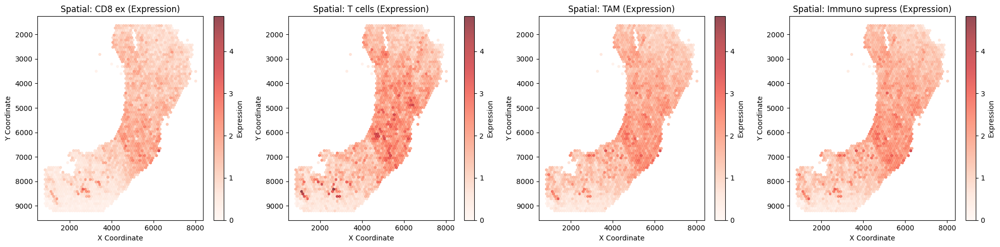

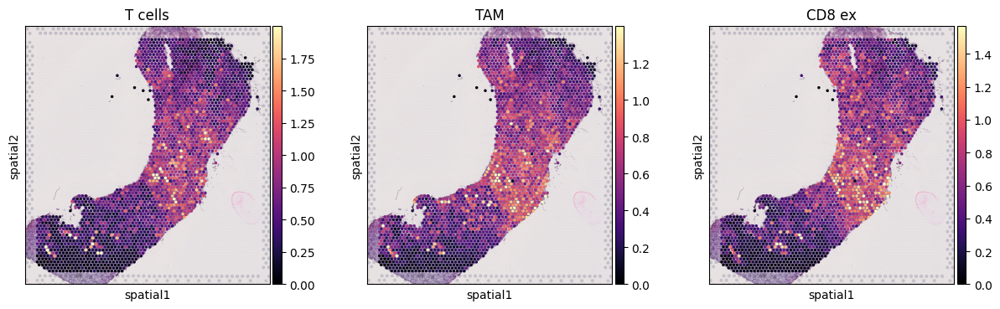

In [1703]:
import matplotlib.pyplot as plt
import numpy as np

# 발현 데이터 불러오기
cd8_ex_expression = Iadata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_CD8 ex']
t_cells_expression = Iadata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_T cells']
tam_expression = Iadata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_TAM']

# Immuno suppress 기준으로 최대 발현 값 계산
immuno_suppress_expression = np.maximum(cd8_ex_expression, tam_expression)  # Immuno suppress 기준
max_expression = np.max([cd8_ex_expression, t_cells_expression, tam_expression])  # 세 가지 세포의 최대 발현 값

# 서브플롯 생성
fig, axes = plt.subplots(1, 4, figsize=(20, 5))  # 1행 4열, 각각 크기 5x5

# 공통 colorbar 범위 설정 (최대 발현 값 기준)
vmin = 0
vmax = max_expression

# 첫 번째 플롯: CD8 ex
scatter = axes[0].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=cd8_ex_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[0].invert_yaxis()
axes[0].set_title("Spatial: CD8 ex (Expression)")
axes[0].set_xlabel("X Coordinate")
axes[0].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[0], label="Expression")

# 두 번째 플롯: T cells
scatter = axes[1].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=t_cells_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[1].invert_yaxis()
axes[1].set_title("Spatial: T cells (Expression)")
axes[1].set_xlabel("X Coordinate")
axes[1].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[1], label="Expression")

# 세 번째 플롯: TAM
scatter = axes[2].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=tam_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[2].invert_yaxis()
axes[2].set_title("Spatial: TAM (Expression)")
axes[2].set_xlabel("X Coordinate")
axes[2].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[2], label="Expression")

# 네 번째 플롯: Immuno suppress
scatter = axes[3].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=immuno_suppress_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[3].invert_yaxis()
axes[3].set_title("Spatial: Immuno supress (Expression)")
axes[3].set_xlabel("X Coordinate")
axes[3].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[3], label="Expression")

# 서브플롯 간 간격 조정
plt.tight_layout()

# 그래프 출력
plt.show()

with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4, 4]}):

    sc.pl.spatial(Iadata, cmap='magma',
              color=['T cells', 'TAM','CD8 ex'],
              ncols=4, size=1.3,
              img_key='hires',
              vmin=0, vmax='p99.2',
              library_id='spaceranger130_count_44317_6800STDY12499507_GRCh38-2020-A')

In [1707]:
Iadata = sc.read_h5ad('/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Immune_Deconvolution/N_immune_6800STDY12499502.h5ad')

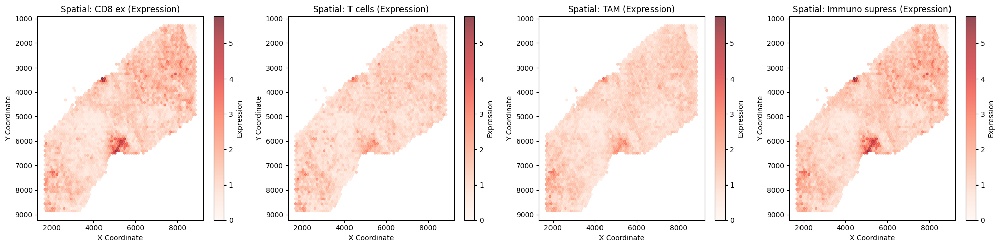

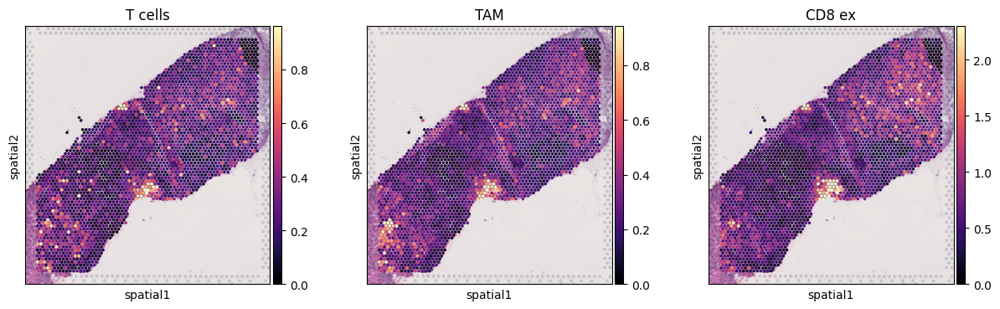

In [1709]:
import matplotlib.pyplot as plt
import numpy as np

# 발현 데이터 불러오기
cd8_ex_expression = Iadata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_CD8 ex']
t_cells_expression = Iadata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_T cells']
tam_expression = Iadata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_TAM']

# Immuno suppress 기준으로 최대 발현 값 계산
immuno_suppress_expression = np.maximum(cd8_ex_expression, tam_expression)  # Immuno suppress 기준
max_expression = np.max([cd8_ex_expression, t_cells_expression, tam_expression])  # 세 가지 세포의 최대 발현 값

# 서브플롯 생성
fig, axes = plt.subplots(1, 4, figsize=(20, 5))  # 1행 4열, 각각 크기 5x5

# 공통 colorbar 범위 설정 (최대 발현 값 기준)
vmin = 0
vmax = max_expression

# 첫 번째 플롯: CD8 ex
scatter = axes[0].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=cd8_ex_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[0].invert_yaxis()
axes[0].set_title("Spatial: CD8 ex (Expression)")
axes[0].set_xlabel("X Coordinate")
axes[0].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[0], label="Expression")

# 두 번째 플롯: T cells
scatter = axes[1].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=t_cells_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[1].invert_yaxis()
axes[1].set_title("Spatial: T cells (Expression)")
axes[1].set_xlabel("X Coordinate")
axes[1].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[1], label="Expression")

# 세 번째 플롯: TAM
scatter = axes[2].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=tam_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[2].invert_yaxis()
axes[2].set_title("Spatial: TAM (Expression)")
axes[2].set_xlabel("X Coordinate")
axes[2].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[2], label="Expression")

# 네 번째 플롯: Immuno suppress
scatter = axes[3].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=immuno_suppress_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[3].invert_yaxis()
axes[3].set_title("Spatial: Immuno supress (Expression)")
axes[3].set_xlabel("X Coordinate")
axes[3].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[3], label="Expression")

# 서브플롯 간 간격 조정
plt.tight_layout()
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4, 4]}):

    sc.pl.spatial(Iadata, cmap='magma',
              color=['T cells', 'TAM','CD8 ex'],
              ncols=4, size=1.3,
              img_key='hires',
              vmin=0, vmax='p99.2',
              library_id='spaceranger130_count_44316_6800STDY12499502_GRCh38-2020-A')

In [1716]:
Iadata = sc.read_h5ad('/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Immune_Deconvolution/N_immune_6800STDY12499411.h5ad')

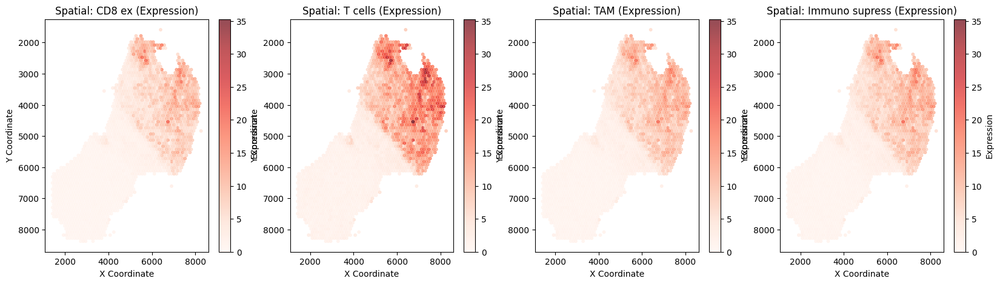

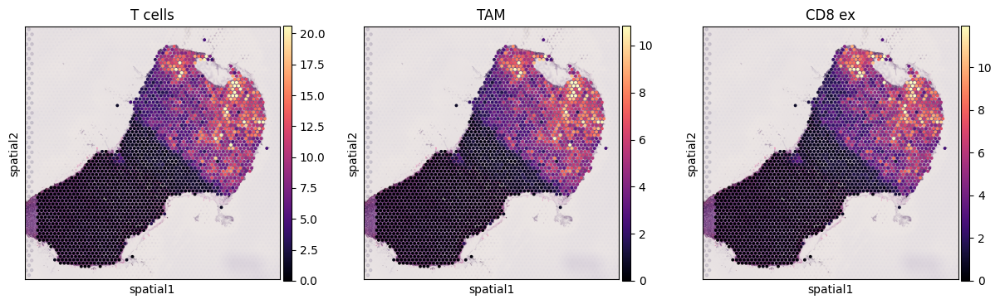

In [1717]:
import matplotlib.pyplot as plt
import numpy as np

# 발현 데이터 불러오기
cd8_ex_expression = Iadata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_CD8 ex']
t_cells_expression = Iadata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_T cells']
tam_expression = Iadata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_TAM']

# Immuno suppress 기준으로 최대 발현 값 계산
immuno_suppress_expression = np.maximum(cd8_ex_expression, tam_expression)  # Immuno suppress 기준
max_expression = np.max([cd8_ex_expression, t_cells_expression, tam_expression])  # 세 가지 세포의 최대 발현 값

# 서브플롯 생성
fig, axes = plt.subplots(1, 4, figsize=(20, 5))  # 1행 4열, 각각 크기 5x5

# 공통 colorbar 범위 설정 (최대 발현 값 기준)
vmin = 0
vmax = max_expression

# 첫 번째 플롯: CD8 ex
scatter = axes[0].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=cd8_ex_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[0].invert_yaxis()
axes[0].set_title("Spatial: CD8 ex (Expression)")
axes[0].set_xlabel("X Coordinate")
axes[0].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[0], label="Expression")

# 두 번째 플롯: T cells
scatter = axes[1].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=t_cells_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[1].invert_yaxis()
axes[1].set_title("Spatial: T cells (Expression)")
axes[1].set_xlabel("X Coordinate")
axes[1].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[1], label="Expression")

# 세 번째 플롯: TAM
scatter = axes[2].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=tam_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[2].invert_yaxis()
axes[2].set_title("Spatial: TAM (Expression)")
axes[2].set_xlabel("X Coordinate")
axes[2].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[2], label="Expression")

# 네 번째 플롯: Immuno suppress
scatter = axes[3].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=immuno_suppress_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[3].invert_yaxis()
axes[3].set_title("Spatial: Immuno supress (Expression)")
axes[3].set_xlabel("X Coordinate")
axes[3].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[3], label="Expression")


with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4, 4]}):

    sc.pl.spatial(Iadata, cmap='magma',
              color=['T cells', 'TAM','CD8 ex'],
              ncols=4, size=1.3,
              img_key='hires',
              vmin=0, vmax='p99.2',
              library_id='spaceranger130_count_44214_6800STDY12499411_GRCh38-2020-A')

In [1718]:
Iadata = sc.read_h5ad('/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Immune_Deconvolution/S3_immune_6800STDY12499411.h5ad')

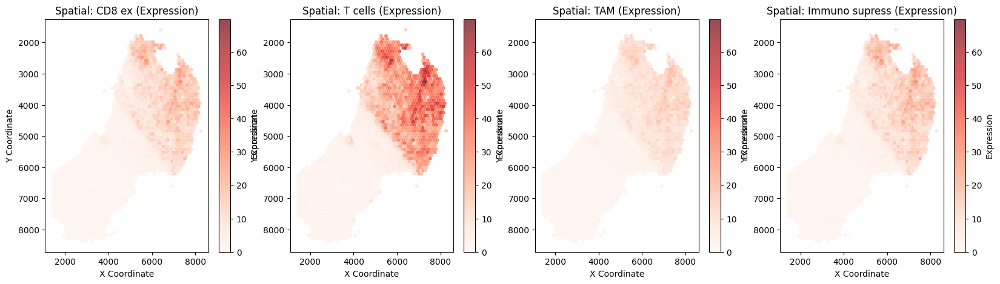

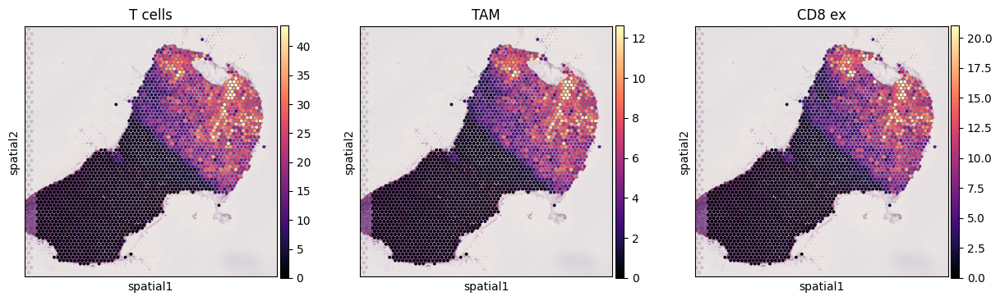

In [1719]:
import matplotlib.pyplot as plt
import numpy as np

# 발현 데이터 불러오기
cd8_ex_expression = Iadata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_CD8 ex']
t_cells_expression = Iadata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_T cells']
tam_expression = Iadata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_TAM']

# Immuno suppress 기준으로 최대 발현 값 계산
immuno_suppress_expression = np.maximum(cd8_ex_expression, tam_expression)  # Immuno suppress 기준
max_expression = np.max([cd8_ex_expression, t_cells_expression, tam_expression])  # 세 가지 세포의 최대 발현 값

# 서브플롯 생성
fig, axes = plt.subplots(1, 4, figsize=(20, 5))  # 1행 4열, 각각 크기 5x5

# 공통 colorbar 범위 설정 (최대 발현 값 기준)
vmin = 0
vmax = max_expression

# 첫 번째 플롯: CD8 ex
scatter = axes[0].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=cd8_ex_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[0].invert_yaxis()
axes[0].set_title("Spatial: CD8 ex (Expression)")
axes[0].set_xlabel("X Coordinate")
axes[0].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[0], label="Expression")

# 두 번째 플롯: T cells
scatter = axes[1].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=t_cells_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[1].invert_yaxis()
axes[1].set_title("Spatial: T cells (Expression)")
axes[1].set_xlabel("X Coordinate")
axes[1].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[1], label="Expression")

# 세 번째 플롯: TAM
scatter = axes[2].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=tam_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[2].invert_yaxis()
axes[2].set_title("Spatial: TAM (Expression)")
axes[2].set_xlabel("X Coordinate")
axes[2].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[2], label="Expression")

# 네 번째 플롯: Immuno suppress
scatter = axes[3].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=immuno_suppress_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[3].invert_yaxis()
axes[3].set_title("Spatial: Immuno supress (Expression)")
axes[3].set_xlabel("X Coordinate")
axes[3].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[3], label="Expression")


with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4, 4]}):

    sc.pl.spatial(Iadata, cmap='magma',
              color=['T cells', 'TAM','CD8 ex'],
              ncols=4, size=1.3,
              img_key='hires',
              vmin=0, vmax='p99.2',
              library_id='spaceranger130_count_44214_6800STDY12499411_GRCh38-2020-A')

In [1722]:
Iadata = sc.read_h5ad('/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Immune_Deconvolution/S3_immune_6800STDY12499502.h5ad')

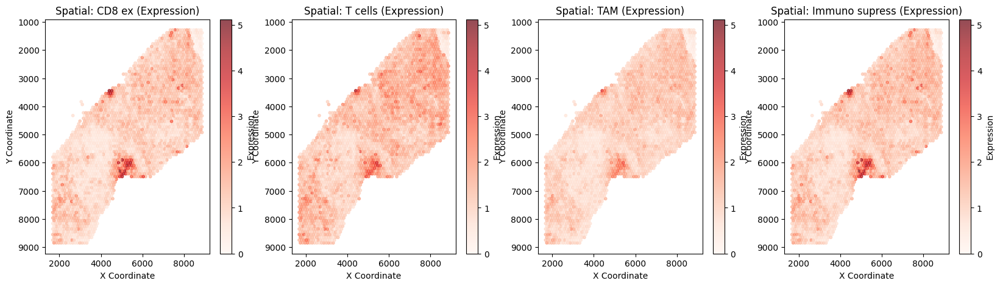

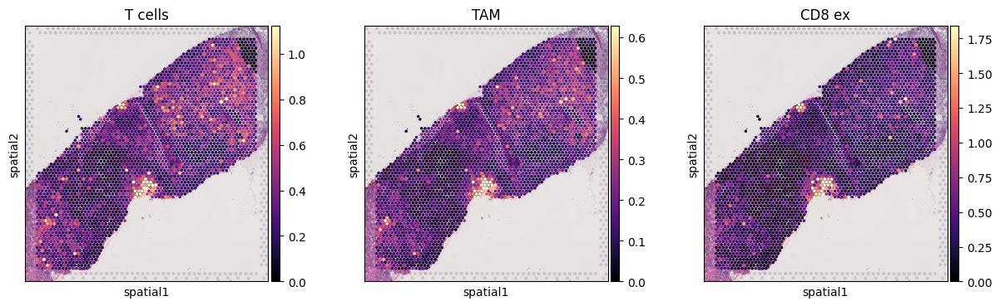

In [1723]:
import matplotlib.pyplot as plt
import numpy as np

# 발현 데이터 불러오기
cd8_ex_expression = Iadata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_CD8 ex']
t_cells_expression = Iadata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_T cells']
tam_expression = Iadata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_TAM']

# Immuno suppress 기준으로 최대 발현 값 계산
immuno_suppress_expression = np.maximum(cd8_ex_expression, tam_expression)  # Immuno suppress 기준
max_expression = np.max([cd8_ex_expression, t_cells_expression, tam_expression])  # 세 가지 세포의 최대 발현 값

# 서브플롯 생성
fig, axes = plt.subplots(1, 4, figsize=(20, 5))  # 1행 4열, 각각 크기 5x5

# 공통 colorbar 범위 설정 (최대 발현 값 기준)
vmin = 0
vmax = max_expression

# 첫 번째 플롯: CD8 ex
scatter = axes[0].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=cd8_ex_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[0].invert_yaxis()
axes[0].set_title("Spatial: CD8 ex (Expression)")
axes[0].set_xlabel("X Coordinate")
axes[0].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[0], label="Expression")

# 두 번째 플롯: T cells
scatter = axes[1].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=t_cells_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[1].invert_yaxis()
axes[1].set_title("Spatial: T cells (Expression)")
axes[1].set_xlabel("X Coordinate")
axes[1].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[1], label="Expression")

# 세 번째 플롯: TAM
scatter = axes[2].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=tam_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[2].invert_yaxis()
axes[2].set_title("Spatial: TAM (Expression)")
axes[2].set_xlabel("X Coordinate")
axes[2].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[2], label="Expression")

# 네 번째 플롯: Immuno suppress
scatter = axes[3].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=immuno_suppress_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[3].invert_yaxis()
axes[3].set_title("Spatial: Immuno supress (Expression)")
axes[3].set_xlabel("X Coordinate")
axes[3].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[3], label="Expression")


with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4, 4]}):

    sc.pl.spatial(Iadata, cmap='magma',
              color=['T cells', 'TAM','CD8 ex'],
              ncols=4, size=1.3,
              img_key='hires',
              vmin=0, vmax='p99.2',
              library_id='spaceranger130_count_44316_6800STDY12499502_GRCh38-2020-A')

In [1724]:
Iadata = sc.read_h5ad('/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Immune_Deconvolution/S3_immune_6800STDY12499507.h5ad')

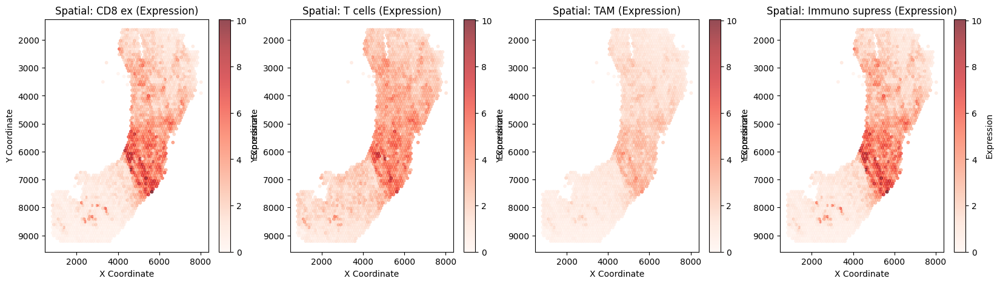

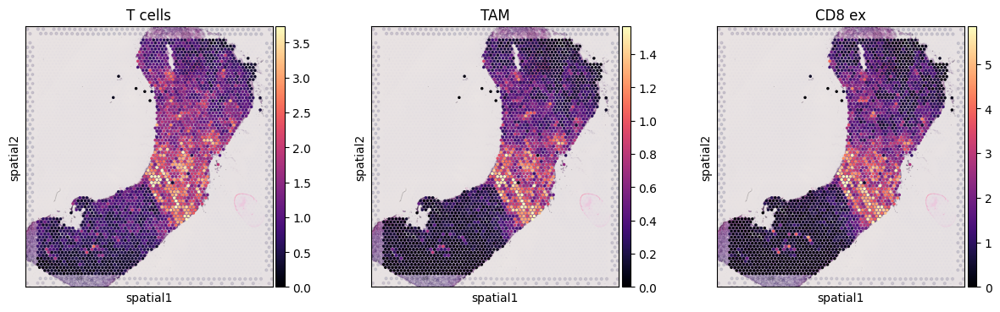

In [1725]:
import matplotlib.pyplot as plt
import numpy as np

# 발현 데이터 불러오기
cd8_ex_expression = Iadata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_CD8 ex']
t_cells_expression = Iadata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_T cells']
tam_expression = Iadata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_TAM']

# Immuno suppress 기준으로 최대 발현 값 계산
immuno_suppress_expression = np.maximum(cd8_ex_expression, tam_expression)  # Immuno suppress 기준
max_expression = np.max([cd8_ex_expression, t_cells_expression, tam_expression])  # 세 가지 세포의 최대 발현 값

# 서브플롯 생성
fig, axes = plt.subplots(1, 4, figsize=(20, 5))  # 1행 4열, 각각 크기 5x5

# 공통 colorbar 범위 설정 (최대 발현 값 기준)
vmin = 0
vmax = max_expression

# 첫 번째 플롯: CD8 ex
scatter = axes[0].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=cd8_ex_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[0].invert_yaxis()
axes[0].set_title("Spatial: CD8 ex (Expression)")
axes[0].set_xlabel("X Coordinate")
axes[0].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[0], label="Expression")

# 두 번째 플롯: T cells
scatter = axes[1].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=t_cells_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[1].invert_yaxis()
axes[1].set_title("Spatial: T cells (Expression)")
axes[1].set_xlabel("X Coordinate")
axes[1].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[1], label="Expression")

# 세 번째 플롯: TAM
scatter = axes[2].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=tam_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[2].invert_yaxis()
axes[2].set_title("Spatial: TAM (Expression)")
axes[2].set_xlabel("X Coordinate")
axes[2].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[2], label="Expression")

# 네 번째 플롯: Immuno suppress
scatter = axes[3].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=immuno_suppress_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[3].invert_yaxis()
axes[3].set_title("Spatial: Immuno supress (Expression)")
axes[3].set_xlabel("X Coordinate")
axes[3].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[3], label="Expression")


with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4, 4]}):

    sc.pl.spatial(Iadata, cmap='magma',
              color=['T cells', 'TAM','CD8 ex'],
              ncols=4, size=1.3,
              img_key='hires',
              vmin=0, vmax='p99.2',
              library_id='spaceranger130_count_44317_6800STDY12499507_GRCh38-2020-A')

In [1726]:
Iadata = sc.read_h5ad('/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Immune_Deconvolution/S4_immune_6800STDY12499411.h5ad')

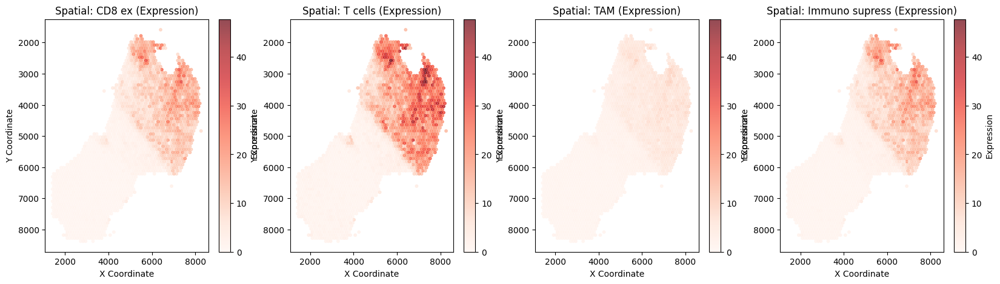

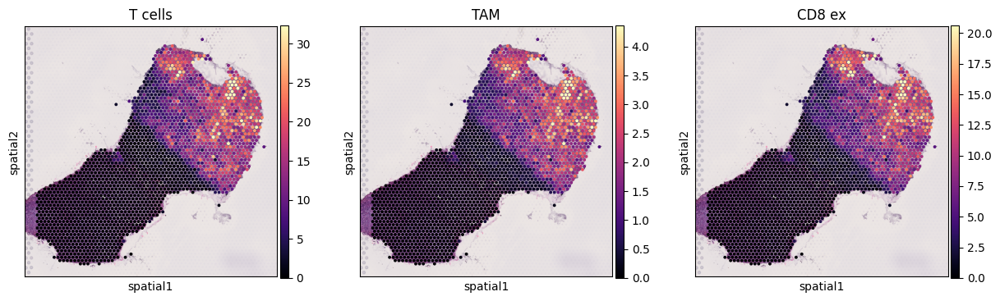

In [1727]:
import matplotlib.pyplot as plt
import numpy as np

# 발현 데이터 불러오기
cd8_ex_expression = Iadata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_CD8 ex']
t_cells_expression = Iadata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_T cells']
tam_expression = Iadata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_TAM']

# Immuno suppress 기준으로 최대 발현 값 계산
immuno_suppress_expression = np.maximum(cd8_ex_expression, tam_expression)  # Immuno suppress 기준
max_expression = np.max([cd8_ex_expression, t_cells_expression, tam_expression])  # 세 가지 세포의 최대 발현 값

# 서브플롯 생성
fig, axes = plt.subplots(1, 4, figsize=(20, 5))  # 1행 4열, 각각 크기 5x5

# 공통 colorbar 범위 설정 (최대 발현 값 기준)
vmin = 0
vmax = max_expression

# 첫 번째 플롯: CD8 ex
scatter = axes[0].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=cd8_ex_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[0].invert_yaxis()
axes[0].set_title("Spatial: CD8 ex (Expression)")
axes[0].set_xlabel("X Coordinate")
axes[0].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[0], label="Expression")

# 두 번째 플롯: T cells
scatter = axes[1].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=t_cells_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[1].invert_yaxis()
axes[1].set_title("Spatial: T cells (Expression)")
axes[1].set_xlabel("X Coordinate")
axes[1].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[1], label="Expression")

# 세 번째 플롯: TAM
scatter = axes[2].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=tam_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[2].invert_yaxis()
axes[2].set_title("Spatial: TAM (Expression)")
axes[2].set_xlabel("X Coordinate")
axes[2].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[2], label="Expression")

# 네 번째 플롯: Immuno suppress
scatter = axes[3].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=immuno_suppress_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[3].invert_yaxis()
axes[3].set_title("Spatial: Immuno supress (Expression)")
axes[3].set_xlabel("X Coordinate")
axes[3].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[3], label="Expression")


with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4, 4]}):

    sc.pl.spatial(Iadata, cmap='magma',
              color=['T cells', 'TAM','CD8 ex'],
              ncols=4, size=1.3,
              img_key='hires',
              vmin=0, vmax='p99.2',
              library_id='spaceranger130_count_44214_6800STDY12499411_GRCh38-2020-A')

In [1728]:
Iadata = sc.read_h5ad('/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Immune_Deconvolution/S4_immune_6800STDY12499502.h5ad')

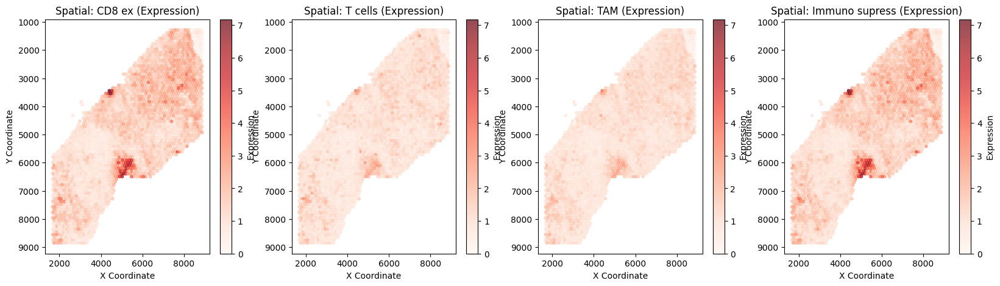

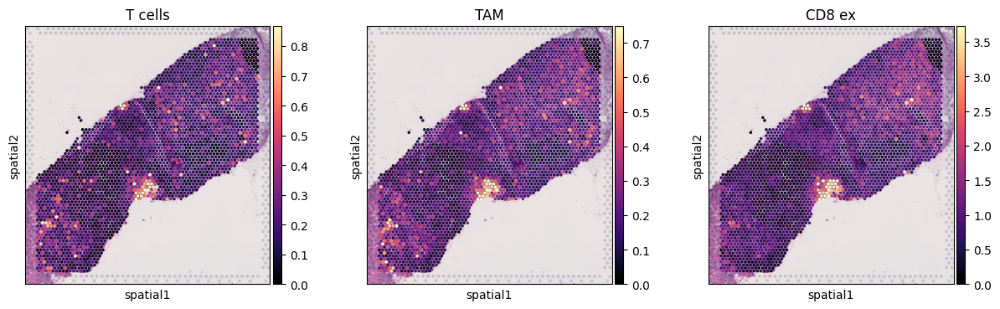

In [1729]:
import matplotlib.pyplot as plt
import numpy as np

# 발현 데이터 불러오기
cd8_ex_expression = Iadata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_CD8 ex']
t_cells_expression = Iadata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_T cells']
tam_expression = Iadata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_TAM']

# Immuno suppress 기준으로 최대 발현 값 계산
immuno_suppress_expression = np.maximum(cd8_ex_expression, tam_expression)  # Immuno suppress 기준
max_expression = np.max([cd8_ex_expression, t_cells_expression, tam_expression])  # 세 가지 세포의 최대 발현 값

# 서브플롯 생성
fig, axes = plt.subplots(1, 4, figsize=(20, 5))  # 1행 4열, 각각 크기 5x5

# 공통 colorbar 범위 설정 (최대 발현 값 기준)
vmin = 0
vmax = max_expression

# 첫 번째 플롯: CD8 ex
scatter = axes[0].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=cd8_ex_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[0].invert_yaxis()
axes[0].set_title("Spatial: CD8 ex (Expression)")
axes[0].set_xlabel("X Coordinate")
axes[0].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[0], label="Expression")

# 두 번째 플롯: T cells
scatter = axes[1].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=t_cells_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[1].invert_yaxis()
axes[1].set_title("Spatial: T cells (Expression)")
axes[1].set_xlabel("X Coordinate")
axes[1].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[1], label="Expression")

# 세 번째 플롯: TAM
scatter = axes[2].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=tam_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[2].invert_yaxis()
axes[2].set_title("Spatial: TAM (Expression)")
axes[2].set_xlabel("X Coordinate")
axes[2].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[2], label="Expression")

# 네 번째 플롯: Immuno suppress
scatter = axes[3].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=immuno_suppress_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[3].invert_yaxis()
axes[3].set_title("Spatial: Immuno supress (Expression)")
axes[3].set_xlabel("X Coordinate")
axes[3].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[3], label="Expression")


with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4, 4]}):

    sc.pl.spatial(Iadata, cmap='magma',
              color=['T cells', 'TAM','CD8 ex'],
              ncols=4, size=1.3,
              img_key='hires',
              vmin=0, vmax='p99.2',
              library_id='spaceranger130_count_44316_6800STDY12499502_GRCh38-2020-A')

In [1730]:
Iadata = sc.read_h5ad('/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Immune_Deconvolution/S4_immune_6800STDY12499507.h5ad')

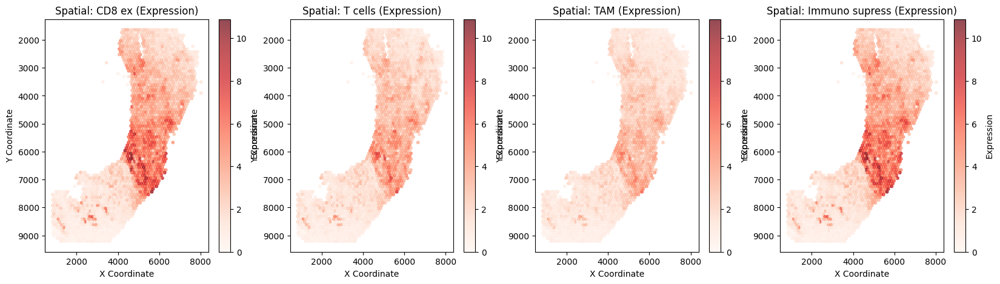

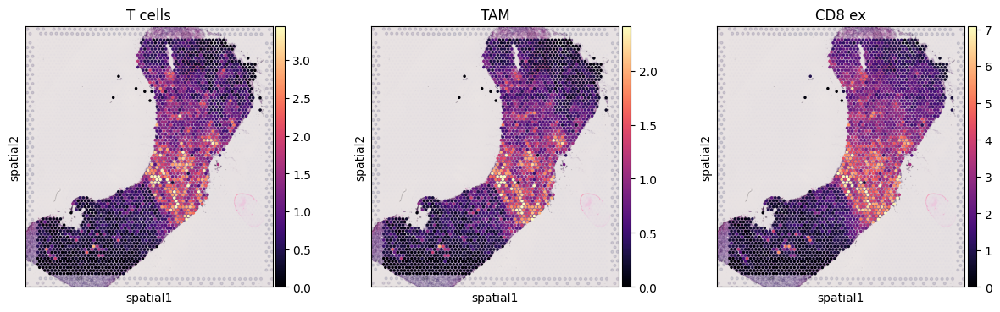

In [1731]:
import matplotlib.pyplot as plt
import numpy as np

# 발현 데이터 불러오기
cd8_ex_expression = Iadata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_CD8 ex']
t_cells_expression = Iadata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_T cells']
tam_expression = Iadata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_TAM']

# Immuno suppress 기준으로 최대 발현 값 계산
immuno_suppress_expression = np.maximum(cd8_ex_expression, tam_expression)  # Immuno suppress 기준
max_expression = np.max([cd8_ex_expression, t_cells_expression, tam_expression])  # 세 가지 세포의 최대 발현 값

# 서브플롯 생성
fig, axes = plt.subplots(1, 4, figsize=(20, 5))  # 1행 4열, 각각 크기 5x5

# 공통 colorbar 범위 설정 (최대 발현 값 기준)
vmin = 0
vmax = max_expression

# 첫 번째 플롯: CD8 ex
scatter = axes[0].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=cd8_ex_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[0].invert_yaxis()
axes[0].set_title("Spatial: CD8 ex (Expression)")
axes[0].set_xlabel("X Coordinate")
axes[0].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[0], label="Expression")

# 두 번째 플롯: T cells
scatter = axes[1].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=t_cells_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[1].invert_yaxis()
axes[1].set_title("Spatial: T cells (Expression)")
axes[1].set_xlabel("X Coordinate")
axes[1].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[1], label="Expression")

# 세 번째 플롯: TAM
scatter = axes[2].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=tam_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[2].invert_yaxis()
axes[2].set_title("Spatial: TAM (Expression)")
axes[2].set_xlabel("X Coordinate")
axes[2].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[2], label="Expression")

# 네 번째 플롯: Immuno suppress
scatter = axes[3].scatter(
    Iadata.obsm['spatial'][:, 0],
    Iadata.obsm['spatial'][:, 1],
    c=immuno_suppress_expression,
    cmap="Reds",  # 빨간색 계열로 통일
    s=10,
    alpha=0.7,
    vmin=vmin,
    vmax=vmax
)
axes[3].invert_yaxis()
axes[3].set_title("Spatial: Immuno supress (Expression)")
axes[3].set_xlabel("X Coordinate")
axes[3].set_ylabel("Y Coordinate")
fig.colorbar(scatter, ax=axes[3], label="Expression")


with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4, 4]}):

    sc.pl.spatial(Iadata, cmap='magma',
              color=['T cells', 'TAM','CD8 ex'],
              ncols=4, size=1.3,
              img_key='hires',
              vmin=0, vmax='p99.2',
              library_id='spaceranger130_count_44317_6800STDY12499507_GRCh38-2020-A')

In [ ]:
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4, 4]}):

    sc.pl.spatial(adata, cmap='magma',
              color=['normal', 'tumor'],
              ncols=4, size=1.3,
              img_key='hires',
              vmin=0, vmax='p99.2',
              library_id='spaceranger130_count_44316_6800STDY12499502_GRCh38-2020-A')

In [ ]:
##############################################   Extract Spatial spot    ###################################################

In [1732]:
adata_N = sc.read_h5ad('/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Immune_Deconvolution/N_immune_6800STDY12499411.h5ad')

In [1733]:
adata_3 = sc.read_h5ad('/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Immune_Deconvolution/S3_immune_6800STDY12499411.h5ad')

In [1734]:
adata_4 = sc.read_h5ad('/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Immune_Deconvolution/S4_immune_6800STDY12499411.h5ad')

In [1767]:
# 각 AnnData 객체의 q95_cell_abundance_w_sf에서 열 이름 추출 및 접두어 제거
adata_dict = {
    'adata_N': [key.replace('q95cell_abundance_w_sf_', '') for key in adata_N.obsm['q95_cell_abundance_w_sf'].keys()],
    'adata_3': [key.replace('q95cell_abundance_w_sf_', '') for key in adata_3.obsm['q95_cell_abundance_w_sf'].keys()],
    'adata_4': [key.replace('q95cell_abundance_w_sf_', '') for key in adata_4.obsm['q95_cell_abundance_w_sf'].keys()]
}


adata_dict

{'adata_N': ['CD8 ex',
  'Endothelial cells',
  'ILC',
  'No defined cell',
  'T cells',
  'TAM'],
 'adata_3': ['B cells',
  'CD8 ex',
  'DC',
  'Endothelial cells',
  'ILC',
  'Macrophages',
  'Mast cells',
  'Monocytes',
  'No defined cell',
  'Plasma cells',
  'T cells',
  'TAM',
  'Treg'],
 'adata_4': ['CD8 ex',
  'Endothelial cells',
  'ILC',
  'Macrophages',
  'No defined cell',
  'T cells',
  'TAM',
  'Treg']}

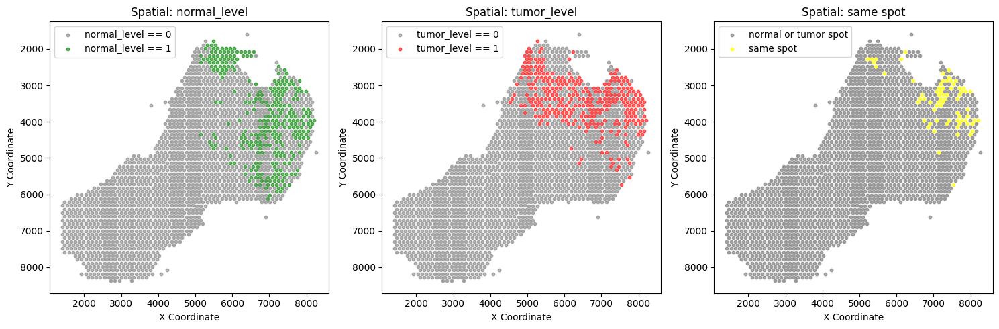

In [1949]:
import matplotlib.pyplot as plt
import numpy as np
import scanpy as sc

# 데이터 로드
adata = sc.read_h5ad('/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC spatial/Tumor_Deconvolution_rar/decon_6800STDY12499411')

sc.pp.normalize_total(adata)

sc.pp.log1p(adata)

# 80% 분위수 계산 및 이진화
quantile_750 = np.quantile(adata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_normal'], 0.85)
quantile_751 = np.quantile(adata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_tumor'], 0.85)

adata.obs['normal_level'] = (adata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_normal'] >= quantile_750).astype(int)
adata.obs['tumor_level'] = (adata.obsm['q95_cell_abundance_w_sf']['q95cell_abundance_w_sf_tumor'] >= quantile_751).astype(int)

# 'No level' 정의
adata.obs['No level'] = 'normal or tumor spot'
adata.obs.loc[(adata.obs['normal_level'] == 1) & (adata.obs['tumor_level'] == 1), 'No level'] = 'same spot'

# 공간 좌표 추출
spatial_coords = adata.obsm['spatial']
yellow_coords = spatial_coords[adata.obs['No level'] == 'same spot']
gray_coords = spatial_coords[adata.obs['No level'] == 'normal or tumor spot']

# 서브플롯 생성: normal_level, tumor_level, No level
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# 첫 번째 플롯: normal_level
normal_0_coords = spatial_coords[adata.obs['normal_level'] == 0]
normal_1_coords = spatial_coords[adata.obs['normal_level'] == 1]
axes[0].scatter(normal_0_coords[:, 0], normal_0_coords[:, 1], s=10, color='gray', alpha=0.6, label='normal_level == 0')
axes[0].scatter(normal_1_coords[:, 0], normal_1_coords[:, 1], s=10, color='green', alpha=0.6, label='normal_level == 1')
axes[0].invert_yaxis()
axes[0].set_title("Spatial: normal_level")
axes[0].set_xlabel("X Coordinate")
axes[0].set_ylabel("Y Coordinate")
axes[0].legend()

# 두 번째 플롯: tumor_level
tumor_0_coords = spatial_coords[adata.obs['tumor_level'] == 0]
tumor_1_coords = spatial_coords[adata.obs['tumor_level'] == 1]
axes[1].scatter(tumor_0_coords[:, 0], tumor_0_coords[:, 1], s=10, color='gray', alpha=0.6, label='tumor_level == 0')
axes[1].scatter(tumor_1_coords[:, 0], tumor_1_coords[:, 1], s=10, color='red', alpha=0.6, label='tumor_level == 1')
axes[1].invert_yaxis()
axes[1].set_title("Spatial: tumor_level")
axes[1].set_xlabel("X Coordinate")
axes[1].set_ylabel("Y Coordinate")
axes[1].legend()

# 세 번째 플롯: No level
axes[2].scatter(gray_coords[:, 0], gray_coords[:, 1], color='gray', label='normal or tumor spot', alpha=0.7, s=10)
axes[2].scatter(yellow_coords[:, 0], yellow_coords[:, 1], color='yellow', label='same spot', alpha=0.7, s=10)
axes[2].invert_yaxis()
axes[2].set_title("Spatial: same spot")
axes[2].set_xlabel("X Coordinate")
axes[2].set_ylabel("Y Coordinate")
axes[2].legend()

plt.tight_layout()
plt.show()





In [1950]:
import pandas as pd

normal_spots = adata[(adata.obs['normal_level'] == 1) & (adata.obs['No level'] != 'same spot')]
tumor_spots = adata[(adata.obs['tumor_level'] == 1)& (adata.obs['No level'] != 'same spot')]
same_spots = adata[adata.obs['No level'] == 'same spot']
# 평균 발현 계산
same_avg = same_spots.to_df().mean(axis=0)
normal_avg = normal_spots.to_df().mean(axis=0)
tumor_avg = tumor_spots.to_df().mean(axis=0)

# 데이터프레임으로 통합
expression_df = pd.DataFrame({
    'same_spots': same_avg,
    'normal_spots': normal_avg,
    'tumor_spots': tumor_avg
})
# Fold-change로 독자적 발현 유전자 추출
threshold = 5   # fold-change 기준
unique_same = expression_df[(expression_df['same_spots'] > expression_df['normal_spots'] * threshold) & 
                            (expression_df['same_spots'] > expression_df['tumor_spots'] * threshold)]

unique_normal = expression_df[(expression_df['normal_spots'] > expression_df['same_spots'] * threshold) & 
                               (expression_df['normal_spots'] > expression_df['tumor_spots'] * threshold)]

unique_tumor = expression_df[(expression_df['tumor_spots'] > expression_df['same_spots'] * threshold) & 
                              (expression_df['tumor_spots'] > expression_df['normal_spots'] * threshold)]
# 유전자 이름 추출
unique_same_genes = unique_same.index.tolist()
unique_normal_genes = unique_normal.index.tolist()
unique_tumor_genes = unique_tumor.index.tolist()

print("독자적 발현 유전자 (Same Spots):", unique_same_genes)
print("독자적 발현 유전자 (Normal Spots):", unique_normal_genes)
print("독자적 발현 유전자 (Tumor Spots):", unique_tumor_genes)


독자적 발현 유전자 (Same Spots): ['CH25H', 'IL1A', 'LYPD2', 'RIC3', 'SYBU']
독자적 발현 유전자 (Normal Spots): ['AC016831.7', 'CXCL1', 'FFAR2', 'GFRA1', 'GPM6B', 'HIST1H2AL', 'HIST1H3B', 'HPGD', 'IL1RL1', 'NTM', 'PCOLCE2', 'PTX3', 'STEAP2', 'THBS2', 'ZNF320']
독자적 발현 유전자 (Tumor Spots): ['ADAMTS6', 'FCGR3B', 'IRX2', 'PCDH9', 'RNF212', 'SLC16A10', 'TCHH', 'ZC3H11A']


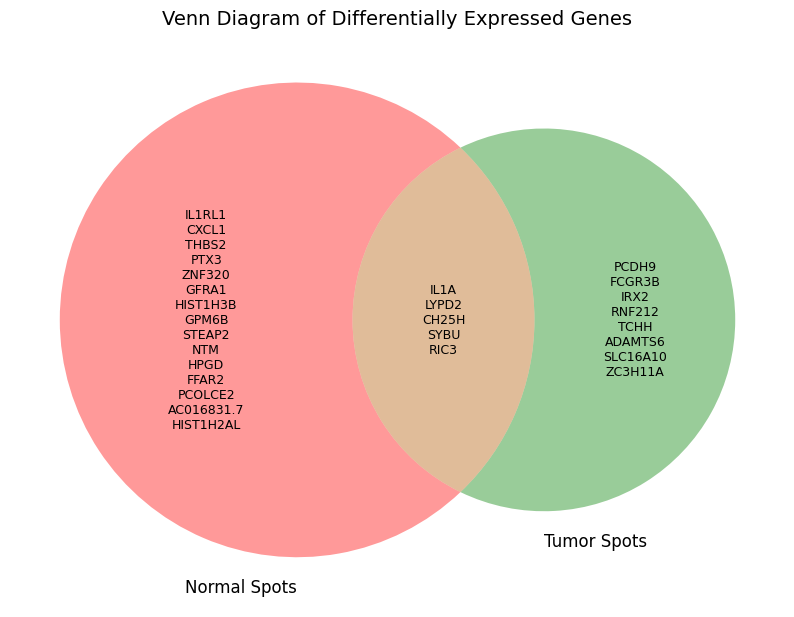

In [1968]:
# 벤다이어그램에 유전자 이름 추가
plt.figure(figsize=(10, 8))
venn = venn2(
    subsets=(normal_genes, tumor_genes),
    set_labels=('Normal Spots', 'Tumor Spots')
)

# 각 영역에 유전자 이름 추가
venn.get_label_by_id('10').set_text('\n'.join(normal_genes - tumor_genes))
venn.get_label_by_id('01').set_text('\n'.join(tumor_genes - normal_genes))
venn.get_label_by_id('11').set_text('\n'.join(normal_genes & tumor_genes))

# 라벨 및 제목 조정
for label in venn.set_labels:
    label.set_fontsize(12)
for label in venn.subset_labels:
    if label:
        label.set_fontsize(9)

plt.title("VennDiagram of Differentially Expressed Genes", fontsize=14)
plt.show()


In [1951]:
# 관심 있는 유전자 목록
genes_of_interest = ['CH25H', 'CYP26B1', 'GAS1', 'HIST1H2BN', 'RIC3', 'SYBU']

# expression_df에서 해당 유전자들만 선택
filtered_expression_df = expression_df.loc[genes_of_interest]

# 출력
print(filtered_expression_df)


           same_spots  normal_spots  tumor_spots
SYMBOL                                          
CH25H        0.009745      0.000000     0.000000
CYP26B1      0.009059      0.006295     0.003631
GAS1         0.006849      0.005074     0.000000
HIST1H2BN    0.015927      0.002080     0.005461
RIC3         0.007246      0.000000     0.001283
SYBU         0.008825      0.000000     0.000000


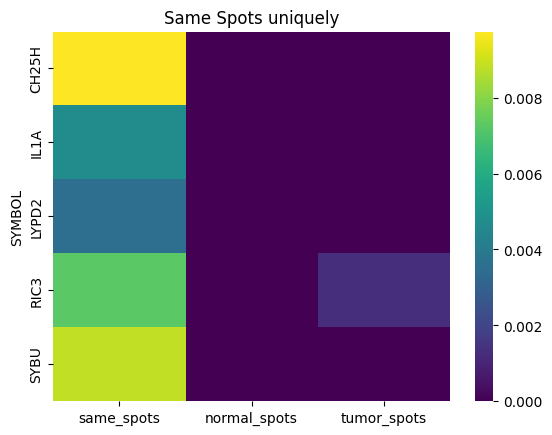

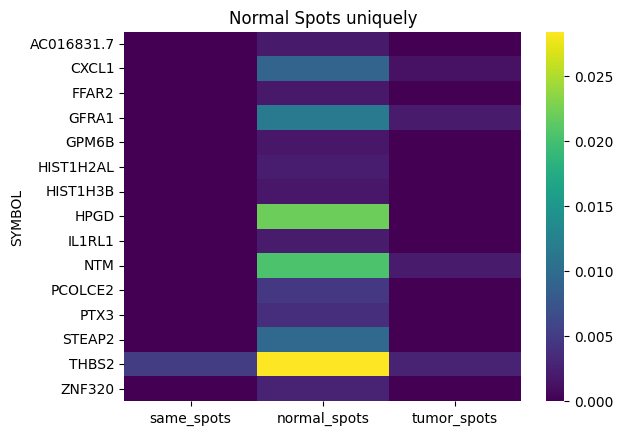

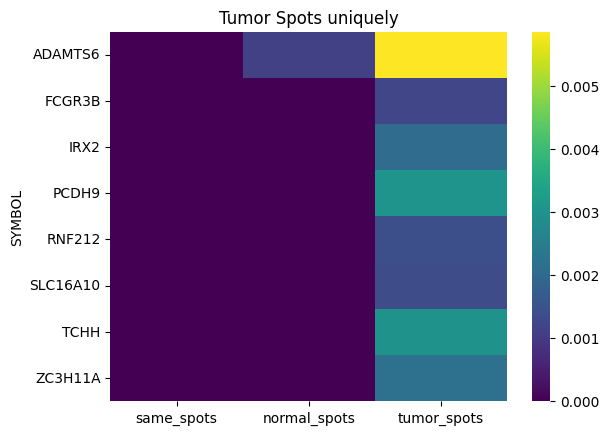

In [1952]:
import seaborn as sns
import matplotlib.pyplot as plt

# 히트맵 그리기
sns.heatmap(expression_df.loc[unique_same_genes], cmap="viridis", annot=False)
plt.title("Same Spots uniquely")
plt.show()

sns.heatmap(expression_df.loc[unique_normal_genes], cmap="viridis", annot=False)
plt.title("Normal Spots uniquely")
plt.show()

sns.heatmap(expression_df.loc[unique_tumor_genes], cmap="viridis", annot=False)
plt.title("Tumor Spots uniquely")
plt.show()

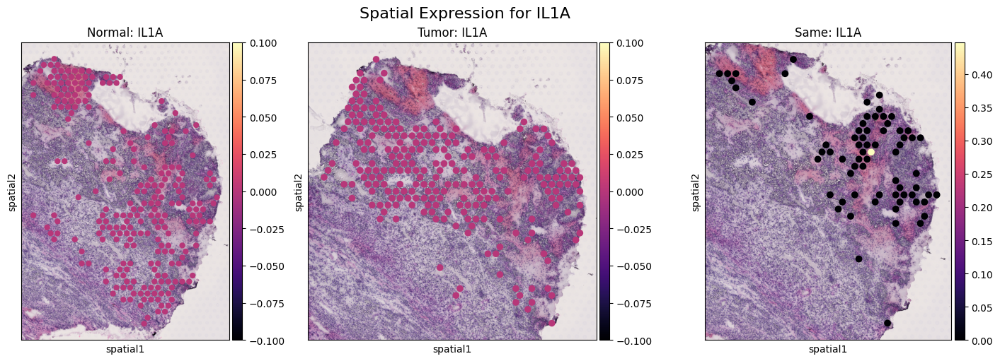

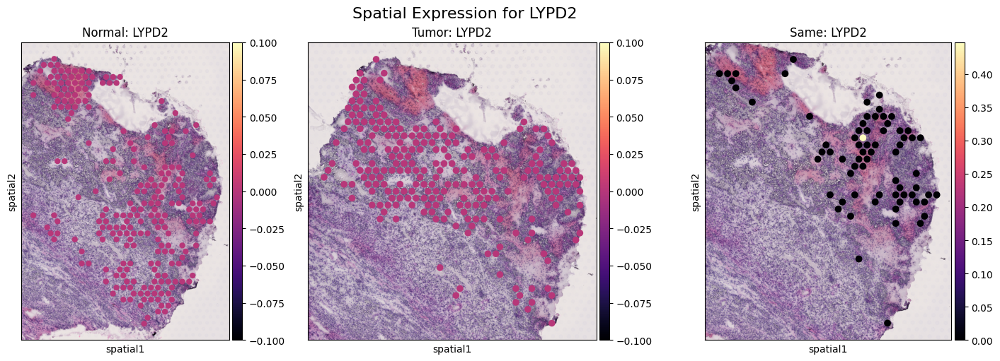

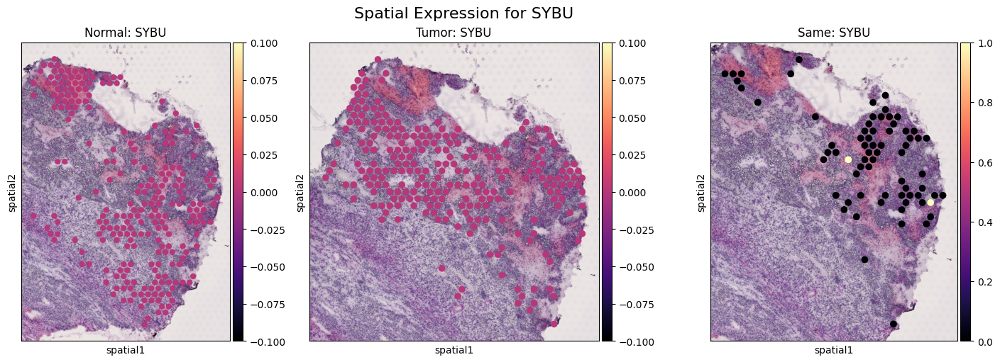

In [1969]:
import scanpy as sc
import matplotlib.pyplot as plt

# 관심 있는 유전자 목록
gene_list = [
 'IL1A', 'LYPD2', 'SYBU'
]

# 유전자 필터링 (adata.var에 존재하는 유전자만 포함)
filtered_gene_list = [gene for gene in gene_list if gene in adata.var.index]

# 조건에 따라 좌표 필터링
normal_spots = adata[(adata.obs['normal_level'] == 1) & (adata.obs['No level'] != 'same spot')]
tumor_spots = adata[(adata.obs['tumor_level'] == 1) & (adata.obs['No level'] != 'same spot')]
same_spots = adata[adata.obs['No level'] == 'same spot']

# 함수 정의: 조건별 유전자 발현 시각화
def plot_grouped_spatial_expression(normal_adata, tumor_adata, same_adata, genes):
    for gene in genes:
        fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)
        
        # Normal Spot
        sc.pl.spatial(
            normal_adata,
            color=gene,
            size=1.3,
            cmap='magma',
            img_key='hires',
            vmin=0,
            vmax='p99.2',
            title=f"Normal: {gene}",
            ax=axes[0],
            show=False,
            library_id='spaceranger130_count_44214_6800STDY12499411_GRCh38-2020-A'
        )
        
        # Tumor Spot
        sc.pl.spatial(
            tumor_adata,
            color=gene,
            size=1.3,
            cmap='magma',
            img_key='hires',
            vmin=0,
            vmax='p99.2',
            title=f"Tumor: {gene}",
            ax=axes[1],
            show=False,
            library_id='spaceranger130_count_44214_6800STDY12499411_GRCh38-2020-A'
        )
        
        # Same Spot
        sc.pl.spatial(
            same_adata,
            color=gene,
            size=1.3,
            cmap='magma',
            img_key='hires',
            vmin=0,
            vmax='p99.2',
            title=f"Same: {gene}",
            ax=axes[2],
            show=False,
            library_id='spaceranger130_count_44214_6800STDY12499411_GRCh38-2020-A'
        )
        
        # 제목 및 표시
        plt.suptitle(f"Spatial Expression for {gene}", fontsize=16)
        plt.show()

# 실행: Normal, Tumor, Same Spot에 대해 그룹화된 플롯 생성
plot_grouped_spatial_expression(normal_spots, tumor_spots, same_spots, filtered_gene_list)
